In [43]:
import pandas as pd
import numpy as np
from dateutil.parser import parse 
import matplotlib.pyplot as plt
from numpy.random import randn
from pandas import Series, DataFrame
from pylab import rcParams
import seaborn as sns
%matplotlib inline
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix

In [44]:
df = pd.read_csv(r"C:\Users\arrah\Desktop\Trendminer_Intern\CoffeeML1.csv", parse_dates =["timestamp"])

count_row = df.shape[0]  # gives number of row count
count_column = df.shape[1] # gives number of column count

print('Number of rows: {}'.format(count_row))
print('Number of columns: {}'.format(count_column))

df.head()

Number of rows: 13588472
Number of columns: 11


,timestamp,AnalogVibrationSensor.vibrationTotal,TemperatureAndHumiditySensor.humidity,AnalogNoiseSensor.noiseDiff,TemperatureAndHumiditySensor.temperature,AnalogNoiseSensor.noiseRange,AnalogVibrationSensor.vibrationDiff,AnalogVibrationSensor.vibrationRange,VibrationThresholdSensor.vibrationThreshold,AnalogNoiseSensor.noiseTotal,Keypad.keyPressed
0,2020-07-16 00:00:00.024000+00:00,NaN,NaN,12.0,NaN,17.0,NaN,NaN,NaN,15091.0,NaN
1,2020-07-16 00:00:00.026000+00:00,1548.0,NaN,NaN,NaN,NaN,0.0,2.0,1.0,NaN,NaN
2,2020-07-16 00:00:00.134000+00:00,NaN,NaN,3.0,NaN,11.0,NaN,NaN,NaN,14695.0,NaN
3,2020-07-16 00:00:00.135000+00:00,1550.0,NaN,NaN,NaN,NaN,0.0,2.0,1.0,NaN,NaN
4,2020-07-16 00:00:00.236000+00:00,NaN,NaN,6.0,NaN,6.0,NaN,NaN,NaN,15082.0,NaN


In [45]:
df.columns

Index(['timestamp', 'AnalogVibrationSensor.vibrationTotal',
       'TemperatureAndHumiditySensor.humidity', 'AnalogNoiseSensor.noiseDiff',
       'TemperatureAndHumiditySensor.temperature',
       'AnalogNoiseSensor.noiseRange', 'AnalogVibrationSensor.vibrationDiff',
       'AnalogVibrationSensor.vibrationRange',
       'VibrationThresholdSensor.vibrationThreshold',
       'AnalogNoiseSensor.noiseTotal', 'Keypad.keyPressed'],
      dtype='object')

In [46]:
# convert the 'timestamp' column to datetime format 
type(df.timestamp[0])

pandas._libs.tslibs.timestamps.Timestamp

In [47]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13588472 entries, 0 to 13588471
Data columns (total 11 columns):
 #   Column                                       Dtype              
---  ------                                       -----              
 0   timestamp                                    datetime64[ns, UTC]
 1   AnalogVibrationSensor.vibrationTotal         float64            
 2   TemperatureAndHumiditySensor.humidity        float64            
 3   AnalogNoiseSensor.noiseDiff                  float64            
 4   TemperatureAndHumiditySensor.temperature     float64            
 5   AnalogNoiseSensor.noiseRange                 float64            
 6   AnalogVibrationSensor.vibrationDiff          float64            
 7   AnalogVibrationSensor.vibrationRange         float64            
 8   VibrationThresholdSensor.vibrationThreshold  float64            
 9   AnalogNoiseSensor.noiseTotal                 float64            
 10  Keypad.keyPressed                       

In [48]:
df3 = df[0:100000] # first 100000 rows of dataframe
df3

,timestamp,AnalogVibrationSensor.vibrationTotal,TemperatureAndHumiditySensor.humidity,AnalogNoiseSensor.noiseDiff,TemperatureAndHumiditySensor.temperature,AnalogNoiseSensor.noiseRange,AnalogVibrationSensor.vibrationDiff,AnalogVibrationSensor.vibrationRange,VibrationThresholdSensor.vibrationThreshold,AnalogNoiseSensor.noiseTotal,Keypad.keyPressed
0,2020-07-16 00:00:00.024000+00:00,NaN,NaN,12.0,NaN,17.0,NaN,NaN,NaN,15091.0,NaN
1,2020-07-16 00:00:00.026000+00:00,1548.0,NaN,NaN,NaN,NaN,0.0,2.0,1.0,NaN,NaN
2,2020-07-16 00:00:00.134000+00:00,NaN,NaN,3.0,NaN,11.0,NaN,NaN,NaN,14695.0,NaN
3,2020-07-16 00:00:00.135000+00:00,1550.0,NaN,NaN,NaN,NaN,0.0,2.0,1.0,NaN,NaN
4,2020-07-16 00:00:00.236000+00:00,NaN,NaN,6.0,NaN,6.0,NaN,NaN,NaN,15082.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...
99995,2020-07-16 01:14:15.306000+00:00,1554.0,NaN,NaN,NaN,NaN,0.0,2.0,1.0,NaN,NaN
99996,2020-07-16 01:14:15.414000+00:00,NaN,NaN,9.0,NaN,11.0,NaN,NaN,NaN,12999.0,NaN
99997,2020-07-16 01:14:15.416000+00:00,1555.0,NaN,NaN,NaN,NaN,0.0,2.0,1.0,NaN,NaN
99998,2020-07-16 01:14:15.525000+00:00,NaN,NaN,1.0,NaN,10.0,NaN,NaN,NaN,14069.0,NaN


In [49]:
import plotly.express as px
fig = px.line(df3, x='timestamp',y = 'AnalogVibrationSensor.vibrationTotal',title= 'timestamp vs AnalogVibrationSensor.vibrationTotalr with slider')

fig.update_xaxes(
     rangeslider_visible=True,
     rangeselector=dict(
        buttons=list([
            dict(count=1, label="1 day", step="day", stepmode="backward"),
            dict(count=2, label="4 day", step="day", stepmode="backward"),
            dict(count=3, label="7 day", step="day", stepmode="backward"),
            dict(step="all")
        ])
     )
)
fig.show()

In [50]:
import plotly.express as px
fig = px.line(df3, x='timestamp',y = 'AnalogVibrationSensor.vibrationTotal',title= 'timestamp vs AnalogNoiseSensor.noiseTotal with slider')

fig.update_xaxes(
     rangeslider_visible=True,
     rangeselector=dict(
        buttons=list([
            dict(count=1, label="1 day", step="day", stepmode="backward"),
            dict(count=2, label="4 day", step="day", stepmode="backward"),
            dict(count=3, label="7 day", step="day", stepmode="backward"),
            dict(step="all")
        ])
     )
)
fig.show()

In [51]:
df = df.drop_duplicates(["timestamp"])

In [52]:
df.nunique()

timestamp                                      13588472
AnalogVibrationSensor.vibrationTotal                 89
TemperatureAndHumiditySensor.humidity               195
AnalogNoiseSensor.noiseDiff                          82
TemperatureAndHumiditySensor.temperature            106
AnalogNoiseSensor.noiseRange                         75
AnalogVibrationSensor.vibrationDiff                   8
AnalogVibrationSensor.vibrationRange                  9
VibrationThresholdSensor.vibrationThreshold           2
AnalogNoiseSensor.noiseTotal                       8927
Keypad.keyPressed                                     5
dtype: int64

In [53]:
df1= df.set_index('timestamp')
print(type(df1))

<class 'pandas.core.frame.DataFrame'>


In [54]:
print(df1.columns)

Index(['AnalogVibrationSensor.vibrationTotal',
       'TemperatureAndHumiditySensor.humidity', 'AnalogNoiseSensor.noiseDiff',
       'TemperatureAndHumiditySensor.temperature',
       'AnalogNoiseSensor.noiseRange', 'AnalogVibrationSensor.vibrationDiff',
       'AnalogVibrationSensor.vibrationRange',
       'VibrationThresholdSensor.vibrationThreshold',
       'AnalogNoiseSensor.noiseTotal', 'Keypad.keyPressed'],
      dtype='object')


In [55]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 13588472 entries, 2020-07-16 00:00:00.024000+00:00 to 2020-07-22 23:59:59.933000+00:00
Data columns (total 10 columns):
 #   Column                                       Dtype  
---  ------                                       -----  
 0   AnalogVibrationSensor.vibrationTotal         float64
 1   TemperatureAndHumiditySensor.humidity        float64
 2   AnalogNoiseSensor.noiseDiff                  float64
 3   TemperatureAndHumiditySensor.temperature     float64
 4   AnalogNoiseSensor.noiseRange                 float64
 5   AnalogVibrationSensor.vibrationDiff          float64
 6   AnalogVibrationSensor.vibrationRange         float64
 7   VibrationThresholdSensor.vibrationThreshold  float64
 8   AnalogNoiseSensor.noiseTotal                 float64
 9   Keypad.keyPressed                            float64
dtypes: float64(10)
memory usage: 1.1 GB


In [56]:
df1[0:100]

,AnalogVibrationSensor.vibrationTotal,TemperatureAndHumiditySensor.humidity,AnalogNoiseSensor.noiseDiff,TemperatureAndHumiditySensor.temperature,AnalogNoiseSensor.noiseRange,AnalogVibrationSensor.vibrationDiff,AnalogVibrationSensor.vibrationRange,VibrationThresholdSensor.vibrationThreshold,AnalogNoiseSensor.noiseTotal,Keypad.keyPressed
timestamp,,,,,,,,,,
2020-07-16 00:00:00.024000+00:00,NaN,NaN,12.0,NaN,17.0,NaN,NaN,NaN,15091.0,NaN
2020-07-16 00:00:00.026000+00:00,1548.0,NaN,NaN,NaN,NaN,0.0,2.0,1.0,NaN,NaN
2020-07-16 00:00:00.134000+00:00,NaN,NaN,3.0,NaN,11.0,NaN,NaN,NaN,14695.0,NaN
2020-07-16 00:00:00.135000+00:00,1550.0,NaN,NaN,NaN,NaN,0.0,2.0,1.0,NaN,NaN
2020-07-16 00:00:00.236000+00:00,NaN,NaN,6.0,NaN,6.0,NaN,NaN,NaN,15082.0,NaN
...,...,...,...,...,...,...,...,...,...,...
2020-07-16 00:00:04.430000+00:00,NaN,NaN,NaN,NaN,NaN,0.0,2.0,1.0,NaN,NaN
2020-07-16 00:00:04.526000+00:00,NaN,NaN,4.0,NaN,9.0,NaN,NaN,NaN,15360.0,NaN
2020-07-16 00:00:04.540000+00:00,1554.0,NaN,NaN,NaN,NaN,0.0,2.0,1.0,NaN,NaN


In [57]:
df1.index

DatetimeIndex(['2020-07-16 00:00:00.024000+00:00',
               '2020-07-16 00:00:00.026000+00:00',
               '2020-07-16 00:00:00.134000+00:00',
               '2020-07-16 00:00:00.135000+00:00',
               '2020-07-16 00:00:00.236000+00:00',
               '2020-07-16 00:00:00.244000+00:00',
               '2020-07-16 00:00:00.354000+00:00',
               '2020-07-16 00:00:00.355000+00:00',
               '2020-07-16 00:00:00.385000+00:00',
               '2020-07-16 00:00:00.465000+00:00',
               ...
               '2020-07-22 23:59:59.495000+00:00',
               '2020-07-22 23:59:59.603000+00:00',
               '2020-07-22 23:59:59.604000+00:00',
               '2020-07-22 23:59:59.661000+00:00',
               '2020-07-22 23:59:59.705000+00:00',
               '2020-07-22 23:59:59.713000+00:00',
               '2020-07-22 23:59:59.824000+00:00',
               '2020-07-22 23:59:59.825000+00:00',
               '2020-07-22 23:59:59.926000+00:00',
            

Missing values for each of the given Variables

In [58]:
df1.isnull().sum()

AnalogVibrationSensor.vibrationTotal            8098060
TemperatureAndHumiditySensor.humidity          12593318
AnalogNoiseSensor.noiseDiff                     8098060
TemperatureAndHumiditySensor.temperature       12593318
AnalogNoiseSensor.noiseRange                    8098061
AnalogVibrationSensor.vibrationDiff             8098058
AnalogVibrationSensor.vibrationRange            8098058
VibrationThresholdSensor.vibrationThreshold     8098058
AnalogNoiseSensor.noiseTotal                    8098059
Keypad.keyPressed                              13586170
dtype: int64

In [59]:
# Drop rows with any NaN in the selected columns only
df5 = df1.dropna(how='all', subset=['Keypad.keyPressed'])


In [60]:
df5.isnull().sum()

AnalogVibrationSensor.vibrationTotal           1794
TemperatureAndHumiditySensor.humidity          2295
AnalogNoiseSensor.noiseDiff                    2292
TemperatureAndHumiditySensor.temperature       2295
AnalogNoiseSensor.noiseRange                   2290
AnalogVibrationSensor.vibrationDiff            1774
AnalogVibrationSensor.vibrationRange           1753
VibrationThresholdSensor.vibrationThreshold    1619
AnalogNoiseSensor.noiseTotal                   2292
Keypad.keyPressed                                 0
dtype: int64

In [61]:
df5.nunique()

AnalogVibrationSensor.vibrationTotal           58
TemperatureAndHumiditySensor.humidity           6
AnalogNoiseSensor.noiseDiff                     7
TemperatureAndHumiditySensor.temperature        6
AnalogNoiseSensor.noiseRange                   10
AnalogVibrationSensor.vibrationDiff             5
AnalogVibrationSensor.vibrationRange            3
VibrationThresholdSensor.vibrationThreshold     2
AnalogNoiseSensor.noiseTotal                   10
Keypad.keyPressed                               5
dtype: int64

In [62]:
count_row = df5.shape[0]  # gives number of row count
count_column = df5.shape[1] # gives number of column count

print('Number of rows: {}'.format(count_row))
print('Number of columns: {}'.format(count_column))

Number of rows: 2302
Number of columns: 10


In [63]:
df1['Keypad.keyPressed'].value_counts()

1.0    1148
3.0     779
4.0     246
2.0     123
0.0       6
Name: Keypad.keyPressed, dtype: int64

Descriptive statistics

In [64]:
df1.describe()

,AnalogVibrationSensor.vibrationTotal,TemperatureAndHumiditySensor.humidity,AnalogNoiseSensor.noiseDiff,TemperatureAndHumiditySensor.temperature,AnalogNoiseSensor.noiseRange,AnalogVibrationSensor.vibrationDiff,AnalogVibrationSensor.vibrationRange,VibrationThresholdSensor.vibrationThreshold,AnalogNoiseSensor.noiseTotal,Keypad.keyPressed
count,5.490412e+06,995154.000000,5.490412e+06,995154.000000,5.490411e+06,5.490414e+06,5.490414e+06,5.490414e+06,5.490413e+06,2302.000000
mean,1.560209e+03,43.048134,8.154107e+00,30.308984,1.242352e+01,1.871374e-01,1.959203e+00,9.998272e-01,1.454972e+04,2.048219
std,1.186886e+01,3.913398,6.230555e+00,0.739273,5.114193e+00,4.964063e-01,4.559033e-01,1.314598e-02,9.458379e+02,1.128364
min,1.520000e+03,36.000000,-3.000000e+00,29.218750,2.000000e+00,-3.000000e+00,1.000000e+00,0.000000e+00,4.059000e+03,0.000000
25%,1.552000e+03,39.562500,3.000000e+00,29.750000,9.000000e+00,0.000000e+00,2.000000e+00,1.000000e+00,1.391200e+04,1.000000
50%,1.558000e+03,44.500000,7.000000e+00,30.093750,1.100000e+01,0.000000e+00,2.000000e+00,1.000000e+00,1.453900e+04,1.000000
75%,1.567000e+03,46.750000,1.200000e+01,30.656250,1.500000e+01,0.000000e+00,2.000000e+00,1.000000e+00,1.517600e+04,3.000000
max,1.615000e+03,48.125000,1.080000e+02,32.500000,1.070000e+02,4.000000e+00,1.400000e+01,1.000000e+00,2.901200e+04,4.000000


In [65]:
# Use seaborn style defaults and set the default figure size
sns.set(rc={'figure.figsize':(11, 7)})

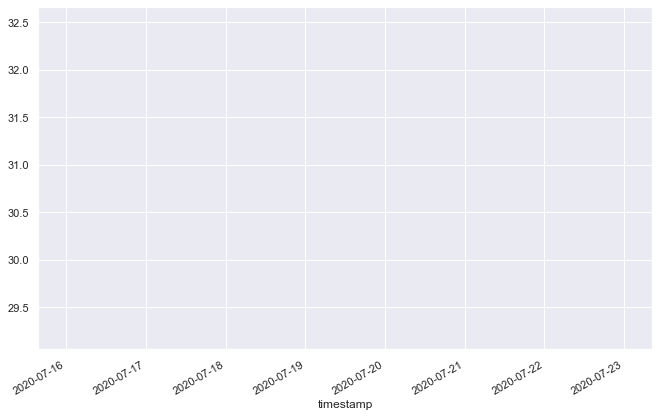

In [66]:
df1['TemperatureAndHumiditySensor.temperature'].plot(linewidth=0.5);

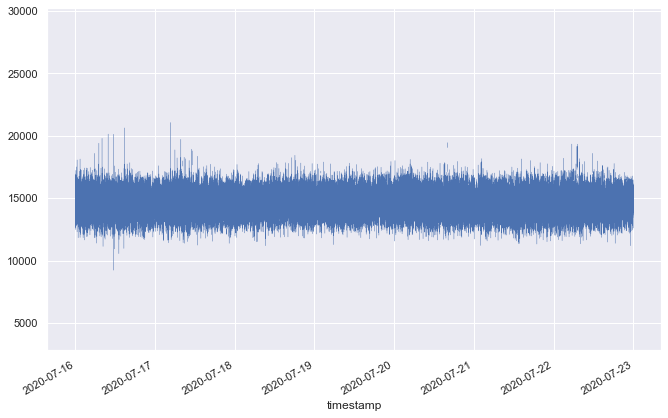

In [67]:
df1['AnalogNoiseSensor.noiseTotal'].plot(linewidth=0.5);

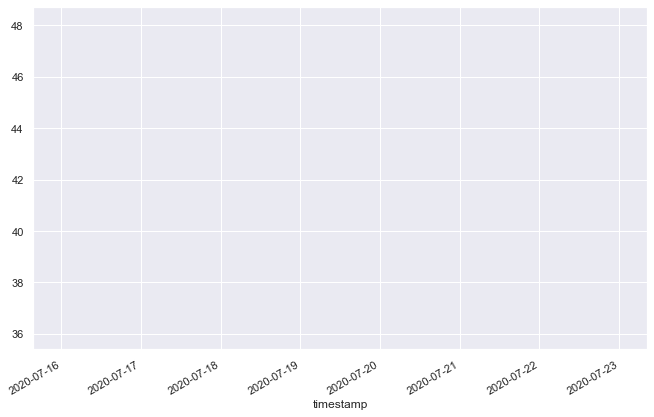

In [68]:
df1['TemperatureAndHumiditySensor.humidity'].plot(linewidth=0.5);

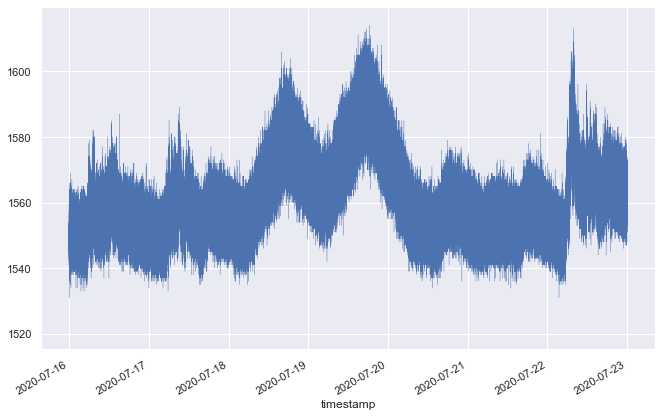

In [69]:
df1['AnalogVibrationSensor.vibrationTotal'].plot(linewidth=0.5);

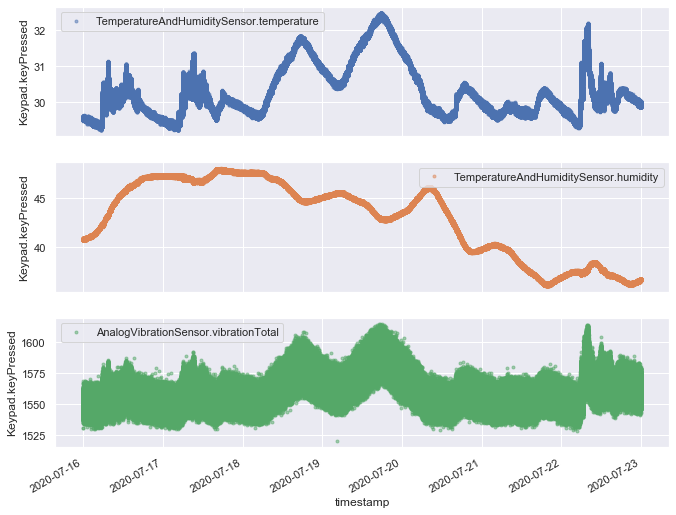

In [70]:
cols_plot = ['TemperatureAndHumiditySensor.temperature', 'TemperatureAndHumiditySensor.humidity', 'AnalogVibrationSensor.vibrationTotal']
axes = df1[cols_plot].plot(marker='.', alpha=0.5, linestyle='None', figsize=(11, 9), subplots=True)
for ax in axes:
    ax.set_ylabel('Keypad.keyPressed')

In [71]:
%matplotlib inline
rcParams['figure.figsize'] = 5, 4

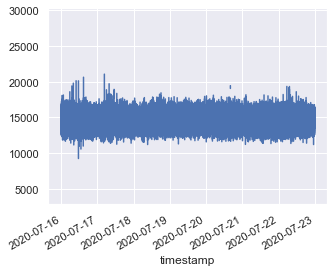

In [72]:
df1['AnalogNoiseSensor.noiseTotal'].plot()

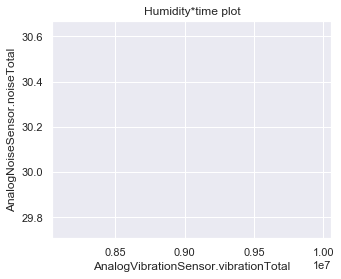

In [73]:
df1 = df.sample(n=100, random_state=25, axis=0)

plt.xlabel('AnalogVibrationSensor.vibrationTotal')
plt.ylabel('AnalogNoiseSensor.noiseTotal')
plt.title('Humidity*time plot')

df1['TemperatureAndHumiditySensor.temperature'].plot()

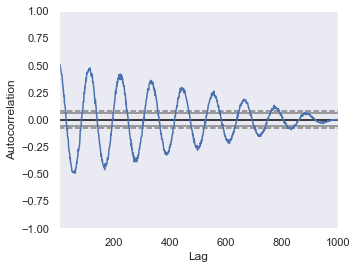

In [74]:
from pandas.plotting import autocorrelation_plot

plt.figure()


spacing = np.linspace(-9 * np.pi, 9 * np.pi, num=1000)

df1= pd.Series(0.7 * np.random.rand(1000) + 0.3 * np.sin(spacing))

autocorrelation_plot(df1)


In [31]:
# Add columns with year, month, and weekday name
#df_y = df1.index.year
print(type(df1.index))
#df_m = df1.index.month
#df_d = df1.index.day

<class 'pandas.core.indexes.base.Index'>


In [ ]:
df1['timestamp'] = pd.to_datetime(df1['timestamp'])
df1['Date'] = df1['timestamp'].dt.strftime('%d/%m/%Y')
df1['Time'] = df1['timestamp'].dt.strftime('%H:%M')

In [ ]:
df1['Date']

In [76]:
df2 = df1[0:100000] # first 100000 rows of dataframe
df2

0      0.052838
1      0.567371
2      0.150331
3      0.537061
4     -0.013579
         ...   
995    0.298585
996    0.418841
997    0.551001
998    0.388559
999    0.674506
Length: 1000, dtype: float64

In [ ]:
import plotly.express as px
fig = px.line(df2, x='AnalogNoiseSensor.noiseTotal',y = 'AnalogVibrationSensor.vibrationTotal',title= 'AnalogNoiseSensor vs nalogVibrationSensor with slider')

fig.update_xaxes(
     rangeslider_visible=True,
     rangeselector=dict(
        buttons=list([
            dict(count=1, label="1 day", step="day", stepmode="backward"),
            dict(count=2, label="4 day", step="day", stepmode="backward"),
            dict(count=3, label="7 day", step="day", stepmode="backward"),
            dict(step="all")
        ])
     )
)
fig.show()

In [ ]:
import plotly.express as px
fig = px.line(df2, x='AnalogVibrationSensor.vibrationDiff',y = 'AnalogVibrationSensor.vibrationRange',title= 'TemperatureAndHumiditySensor.temperature with slider')

fig.update_xaxes(
     rangeslider_visible=True,
     rangeselector=dict(
        buttons=list([
            dict(count=1, label="1 day", step="day", stepmode="backward"),
            dict(count=2, label="4 day", step="day", stepmode="backward"),
            dict(count=3, label="7 day", step="day", stepmode="backward"),
            dict(step="all")
        ])
     )
)
fig.show()

In [ ]:
# Create figure
import plotly.graph_objects as go
fig = go.Figure()

fig.add_trace(
    go.Scatter(x=list(df2.AnalogNoiseSensor.noiseTotal, y=list(df2.TemperatureAndHumiditySensor.temperature))))

In [ ]:
# Set title
fig.update_layout(
    title_text="Time series with range slider and selectors for TemperatureAndHumiditySensor.temperature "
)


In [ ]:

# Add range slider
fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1m",
                     step="month",
                     stepmode="backward"),
                dict(count=6,
                     label="6m",
                     step="month",
                     stepmode="backward"),
                dict(count=1,
                     label="YTD",
                     step="year",
                     stepmode="todate"),
                dict(count=1,
                     label="1y",
                     step="year",
                     stepmode="backward"),
                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

Separating the data set into dependable and independent variables

In [ ]:
X, y = df1.drop(['Keypad.keyPressed'], axis=1), df1['Keypad.keyPressed']
X

Using the method of interpollation to fill in the missing data

In [49]:
X = X.interpolate(method='time', axis=0).ffill().bfill()
X.head()

,AnalogVibrationSensor.vibrationTotal,TemperatureAndHumiditySensor.humidity,AnalogNoiseSensor.noiseDiff,TemperatureAndHumiditySensor.temperature,AnalogNoiseSensor.noiseRange,AnalogVibrationSensor.vibrationDiff,AnalogVibrationSensor.vibrationRange,VibrationThresholdSensor.vibrationThreshold,AnalogNoiseSensor.noiseTotal
timestamp,,,,,,,,,
2020-07-16 00:00:00.024000+00:00,1548.000000,40.75,12.000000,29.53125,17.000000,0.0,2.0,1.0,15091.000000
2020-07-16 00:00:00.026000+00:00,1548.000000,40.75,11.836374,29.53125,16.890916,0.0,2.0,1.0,15083.800469
2020-07-16 00:00:00.134000+00:00,1549.981653,40.75,3.000000,29.53125,11.000000,0.0,2.0,1.0,14695.000000
2020-07-16 00:00:00.135000+00:00,1550.000000,40.75,3.029410,29.53125,10.950983,0.0,2.0,1.0,14698.793880
2020-07-16 00:00:00.236000+00:00,1550.926605,40.75,6.000000,29.53125,6.000000,0.0,2.0,1.0,15082.000000


In [50]:
X.isnull().sum()

AnalogVibrationSensor.vibrationTotal           0
TemperatureAndHumiditySensor.humidity          0
AnalogNoiseSensor.noiseDiff                    0
TemperatureAndHumiditySensor.temperature       0
AnalogNoiseSensor.noiseRange                   0
AnalogVibrationSensor.vibrationDiff            0
AnalogVibrationSensor.vibrationRange           0
VibrationThresholdSensor.vibrationThreshold    0
AnalogNoiseSensor.noiseTotal                   0
dtype: int64

Scaling

In [51]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler

scaler = MinMaxScaler()
#scaler = StandardScaler()

X = pd.DataFrame(scaler.fit_transform(X), index=X.index, columns=X.columns)
X.head()

,AnalogVibrationSensor.vibrationTotal,TemperatureAndHumiditySensor.humidity,AnalogNoiseSensor.noiseDiff,TemperatureAndHumiditySensor.temperature,AnalogNoiseSensor.noiseRange,AnalogVibrationSensor.vibrationDiff,AnalogVibrationSensor.vibrationRange,VibrationThresholdSensor.vibrationThreshold,AnalogNoiseSensor.noiseTotal
timestamp,,,,,,,,,
2020-07-16 00:00:00.024000+00:00,0.294737,0.391753,0.135135,0.095238,0.142857,0.428571,0.076923,1.0,0.442111
2020-07-16 00:00:00.026000+00:00,0.294737,0.391753,0.133661,0.095238,0.141818,0.428571,0.076923,1.0,0.441823
2020-07-16 00:00:00.134000+00:00,0.315596,0.391753,0.054054,0.095238,0.085714,0.428571,0.076923,1.0,0.426241
2020-07-16 00:00:00.135000+00:00,0.315789,0.391753,0.054319,0.095238,0.085247,0.428571,0.076923,1.0,0.426393
2020-07-16 00:00:00.236000+00:00,0.325543,0.391753,0.081081,0.095238,0.038095,0.428571,0.076923,1.0,0.441750


Splitting the data set into train/test

In [ ]:
#splitting for time series data
'''X_train = X[:int(X.shape[0]*0.7)]
X_test = X[int(X.shape[0]*0.7):]
y_train = y[:int(X.shape[0]*0.7)]
y_test = y[int(X.shape[0]*0.7):]''' 

In [52]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

In [64]:
X_train.head()

,AnalogVibrationSensor.vibrationTotal,TemperatureAndHumiditySensor.humidity,AnalogNoiseSensor.noiseDiff,TemperatureAndHumiditySensor.temperature,AnalogNoiseSensor.noiseRange,AnalogVibrationSensor.vibrationDiff,AnalogVibrationSensor.vibrationRange,VibrationThresholdSensor.vibrationThreshold,AnalogNoiseSensor.noiseTotal
timestamp,,,,,,,,,
2020-07-17 10:58:55.654000+00:00,0.388905,0.895340,0.126126,0.238095,0.123810,0.428571,0.076923,1.0,0.414219
2020-07-22 12:22:46.053000+00:00,0.318140,0.136687,0.234234,0.283251,0.190476,0.428571,0.152485,1.0,0.441911
2020-07-21 21:01:33.438000+00:00,0.452440,0.025773,0.099099,0.257143,0.057143,0.571429,0.144056,1.0,0.453212
2020-07-19 22:57:20.817000+00:00,0.636697,0.604119,0.063063,0.721914,0.057143,0.428571,0.082569,1.0,0.409209
2020-07-18 13:41:23.421000+00:00,0.498800,0.829897,0.207207,0.628571,0.190476,0.288221,0.075573,1.0,0.416904


In [54]:
y_train.head()

timestamp
2020-07-17 10:58:55.654000+00:00   NaN
2020-07-22 12:22:46.053000+00:00   NaN
2020-07-21 21:01:33.438000+00:00   NaN
2020-07-19 22:57:20.817000+00:00   NaN
2020-07-18 13:41:23.421000+00:00   NaN
Name: Keypad.keyPressed, dtype: float64